In [7]:
import os, sys
import numpy as np
import urllib.request
import matplotlib.pyplot as plt
from astropy.io import fits
import bettermoments.collapse_cube as bm
%matplotlib inline
import pygtc
import emcee

wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/'

In [198]:
def moment0map(file):
    # load the cube and "header" information
    data = fits.open(wdir + file) # processes cube for V892Tau model
    cube = np.squeeze(data[0].data)
    hdr = data[0].header
    
    # SPATIAL
    # number of pixels in each dimensions
    nRA, nDEC = hdr['NAXIS1'], hdr['NAXIS2']

    # convert pixel indices to RA, DEC (each in units of degrees on the sky)
    RA = hdr['CRVAL1'] + hdr['CDELT1'] * (np.arange(nRA) - (hdr['CRPIX1'] - 1))
    DEC = hdr['CRVAL2'] + hdr['CDELT2'] * (np.arange(nDEC) - (hdr['CRPIX2'] - 1))

    # convert these to offsets from the image center, in **arcseconds** units (1 degree = 3600 arcseconds)
    RAo, DECo = 3600 * (RA - hdr['CRVAL1']), 3600 * (DEC - hdr['CRVAL2'])

    # in some cases, the emission center (= location of star, which we don't see in these data) is offset from the
    # image center; we can correct for that to have a coordinate frame on the sky, centered on the star position
    # (note: these shifts are quite small in this case, but for clarity, here's how you do it)
    offRA, offDEC = -0.02, 0.00    # the offsets (measured elsewhere)
    dRAo, dDECo = RAo - offRA, DECo - offDEC

    # now create a 2-D grid of RA and DEC offsets (relative to emission center) for each pixel in the cube
    dRA, dDEC = np.meshgrid(dRAo, dDECo)

    # SPECTRAL
    # number of channels
    nchan = hdr['NAXIS3']

    # convert channel indices to frequencies (in units of Hz)
    freq = hdr['CRVAL3'] + hdr['CDELT3'] * (np.arange(nchan) - (hdr['CRPIX3'] - 1))

    # use the Doppler formula to calculate the corresponding velocities (in units of km/s)
    c_ = 2.99792e5       # speed of light in km/s
    freq0 = 230.538e9    # rest frequency of CO J=2-1 line in Hz
    vel = c_ * (1. - freq / freq0)

    # bettermoments processing
    noise = 3*np.nanstd(cube[:,0:5,:])
    moment0 = bm.collapse_zeroth(vel, cube, noise)[0]
    dv = vel[2]-vel[1] # in km/s; channel spacing ~ 0.32km/s

    import cmasher as cmr          # color maps
    from astropy.visualization import (AsinhStretch, LogStretch, ImageNormalize, LinearStretch)    # image visualization functions

    #
    # define the full image boundaries with a list of the min/max RA and DEC offsets
    # (note the reverse ordering for RA, since this is plotted with E to the left)
    im_bounds = (dRA.max(), dRA.min(), dDEC.min(), dDEC.max())
    #
    # now set the RA and DEC offset ranges you want to show
    dRA_lims  = [5, -5]      # (same reverse ordering to ensure E is to the left)
    dDEC_lims = [-5, 5]
    #
    # now define the color-map, intensity limits, and stretch
    cmap = cmr.freeze
    vmin, vmax = 0, 1.5  # these are in Jy/beam units (for moment-0)
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

    # set up and plot the image on the specified scale
    fig, ax = plt.subplots()
    im = ax.imshow(moment0, origin='lower', cmap=cmap, extent=im_bounds, norm=norm, aspect='equal')
    ax.set_xlim(dRA_lims)
    ax.set_ylim(dDEC_lims)
    ax.set_xlabel('RA offset [arcsec]')
    ax.set_ylabel('DEC offset [arcsec]')
    ax.set_title(file[:-5])
    
    # add a scalebar
    cb = plt.colorbar(im, ax=ax, pad=0.05)
    cb.set_label('surface brightness * velocity [Jy km/s / beam]', rotation=270, labelpad=25)
    #cb.set_label('brightness temperature [K]', rotation=270, labelpad=13) # for brightness temperature
    
    #plt.savefig('comparison_plots/%s_moment0.png' % (file), dpi=300)

In [251]:
def mk_ch_plots(file, contour, ch_idx, grid): # makes channel plot per channel index
    # load the cube and "header" information
    data = fits.open(wdir + file) # processes cube for V892Tau model
    cube = np.squeeze(data[0].data)
    hdr = data[0].header
 
    c_hdu = fits.open(wdir + contour)[0] # contour data
    
    # SPATIAL
    # number of pixels in each dimensions
    nRA, nDEC = hdr['NAXIS1'], hdr['NAXIS2']

    # convert pixel indices to RA, DEC (each in units of degrees on the sky)
    RA = hdr['CRVAL1'] + hdr['CDELT1'] * (np.arange(nRA) - (hdr['CRPIX1'] - 1))
    DEC = hdr['CRVAL2'] + hdr['CDELT2'] * (np.arange(nDEC) - (hdr['CRPIX2'] - 1))

    # convert these to offsets from the image center, in **arcseconds** units (1 degree = 3600 arcseconds)
    RAo, DECo = 3600 * (RA - hdr['CRVAL1']), 3600 * (DEC - hdr['CRVAL2'])

    # in some cases, the emission center (= location of star, which we don't see in these data) is offset from the
    # image center; we can correct for that to have a coordinate frame on the sky, centered on the star position
    # (note: these shifts are quite small in this case, but for clarity, here's how you do it)
    offRA, offDEC = -0.02, 0.00    # the offsets (measured elsewhere)
    dRAo, dDECo = RAo - offRA, DECo - offDEC

    # now create a 2-D grid of RA and DEC offsets (relative to emission center) for each pixel in the cube
    dRA, dDEC = np.meshgrid(dRAo, dDECo)

    # SPECTRAL
    # number of channels
    nchan = hdr['NAXIS3']

    # convert channel indices to frequencies (in units of Hz)
    freq = hdr['CRVAL3'] + hdr['CDELT3'] * (np.arange(nchan) - (hdr['CRPIX3'] - 1))

    # use the Doppler formula to calculate the corresponding velocities (in units of km/s)
    c_ = 2.99792e5       # speed of light in km/s
    freq0 = 230.538e9    # rest frequency of CO J=2-1 line in Hz
    vel = c_ * (1. - freq / freq0)

    # brighttemp processing
    sys.path.append("/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn")
    from brighttemp import brighttemp as bt
    bmaj = hdr['BMAJ'] * 3600
    bmin = hdr['BMIN'] * 3600
    #k_cube = bt(cube[ch_idx,:,:], (bmaj, bmin), freq0) #converted cube, in K units
    k_cube = bt(cube[:,:,:], (bmaj, bmin), freq0) #converted cube, in K units
    
    # PLOTTING
    import cmasher as cmr          # color maps
    from astropy.visualization import (AsinhStretch, LogStretch, ImageNormalize, LinearStretch)    # image visualization functions

    # define the full image boundaries with a list of the min/max RA and DEC offsets
    # (note the reverse ordering for RA, since this is plotted with E to the left)
    im_bounds = (dRA.max(), dRA.min(), dDEC.min(), dDEC.max())
    
    # now set the RA and DEC offset ranges you want to show
    dRA_lims  = [5, -5]      # (same reverse ordering to ensure E is to the left)
    dDEC_lims = [-5, 5]
    
    # now define the color-map, intensity limits, and stretch
    cmap = cmr.freeze
    #vmin, vmax = -1, 50   # these are in mJy/beam units
    vmin, vmax = -3, 100   # these are in K units (for btemp)
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

    # contour pre-processing
    x = np.linspace(5, -5, 512)
    y = np.linspace(-5, 5, 512)
    X, Y = np.meshgrid(x, y)
    
    if grid == True: #toggles grid vs. individual channel map
        import matplotlib.gridspec as gridspec

        n=10 # number of columns
        vch_idx = np.arange(n**2) # number of channels cube.shape[0]
        axes = ['ax'+ str(i) for i in range(n**2)] # labels for axes

        c = np.arange(n)
        r = np.arange(n)
        cols, rows = np.meshgrid(c, r)
        points = np.column_stack((np.ravel(rows), np.ravel(cols)))
    
        fig = plt.figure(tight_layout=True, figsize=(20,20))
        spec = gridspec.GridSpec(ncols=n, nrows=n, figure=fig)

        for i in range(len(axes)):  
            axes[i] = fig.add_subplot(spec[points[i][0], points[i][1]])
            axes[i].imshow(k_cube[vch_idx[i], :, :], origin='lower', cmap=cmap, extent=im_bounds, norm=norm, aspect='equal')
            axes[i].set_xlim(dRA_lims)
            axes[i].set_ylim(dDEC_lims)
            plt.setp(axes[i].get_xticklabels(), visible=False)
            plt.setp(axes[i].get_yticklabels(), visible=False)        

            # annotate with the velocity
            vel_str = '%.2f km/s' % vel[vch_idx[i]]
            axes[i].text(4.5, 4.0, vel_str, color='w');

            #contours
            contour = axes[i].contour(X, Y, c_hdu.data[vch_idx[i],0,:,:], colors='white', alpha=0.2, linewidths=1)
            savefolder = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/'
            #plt.savefig(savefolder + 'comparison_plots/%s_chmaps_0_5_kms.pdf' % (file))
    
    if grid == False:
        # set up and plot the image on the specified scale
        fig, ax = plt.subplots()
        #im = ax.imshow(1e3*cube[ch_idx,:,:], origin='lower', cmap=cmap, extent=im_bounds, norm=norm, aspect='equal')
        im = ax.imshow(k_cube[ch_idx,:,:], origin='lower', cmap=cmap, extent=im_bounds, norm=norm, aspect='equal')
        ax.set_xlim(dRA_lims)
        ax.set_ylim(dDEC_lims)
        ax.set_xlabel('RA offset [arcsec]')
        ax.set_ylabel('DEC offset [arcsec]')
        ax.set_title(file[:-5])

        # add a scalebar
        cb = plt.colorbar(im, ax=ax, pad=0.05)
        cb.set_label('surface brightness [mJy / beam]', rotation=270, labelpad=13)

        #contours
        contour = ax.contour(X, Y, c_hdu.data[ch_idx,0,:,:], colors='white', alpha=0.2)

        # annotate with the velocity
        vel_str = '%.2f km/s' % vel[ch_idx]
        ax.text(4.5, 4.0, vel_str, color='w');
        ax.text(4.5, 4.0, vel_str, color='w');
        #plt.savefig('comparison_plots/%s_ch%s.png' % (file, ch_idx), dpi=300)

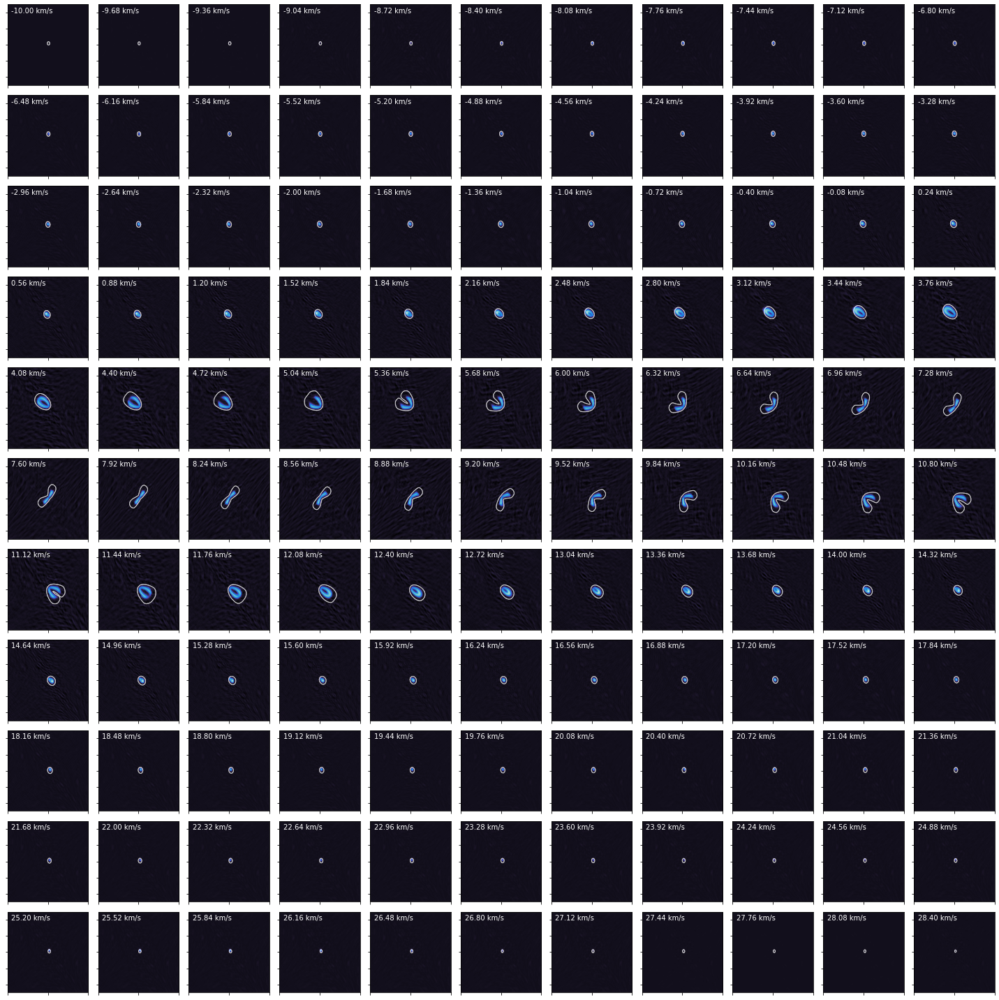

In [204]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/'
mk_ch_plots('im_V892Tau_data.model.image.fits', 'im_V892Tau_data.mask.fits', 47, grid=True)
#mk_ch_plots('im_V892Tau_data.resid.image.fits', 'im_V892Tau_data.mask.fits', 32)

#moment0map('im_V892Tau_data.model.image.fits', 'im_V892Tau_data.mask.fits')

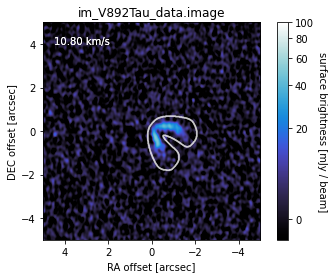

In [242]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/im_V892Tau_data/'
mk_ch_plots('im_V892Tau_data.image.fits', 'im_V892Tau_data.mask.fits', 65, grid=False)
#moment0map('im_V892Tau_data.image.fits', 'im_V892Tau_data.mask.fits')

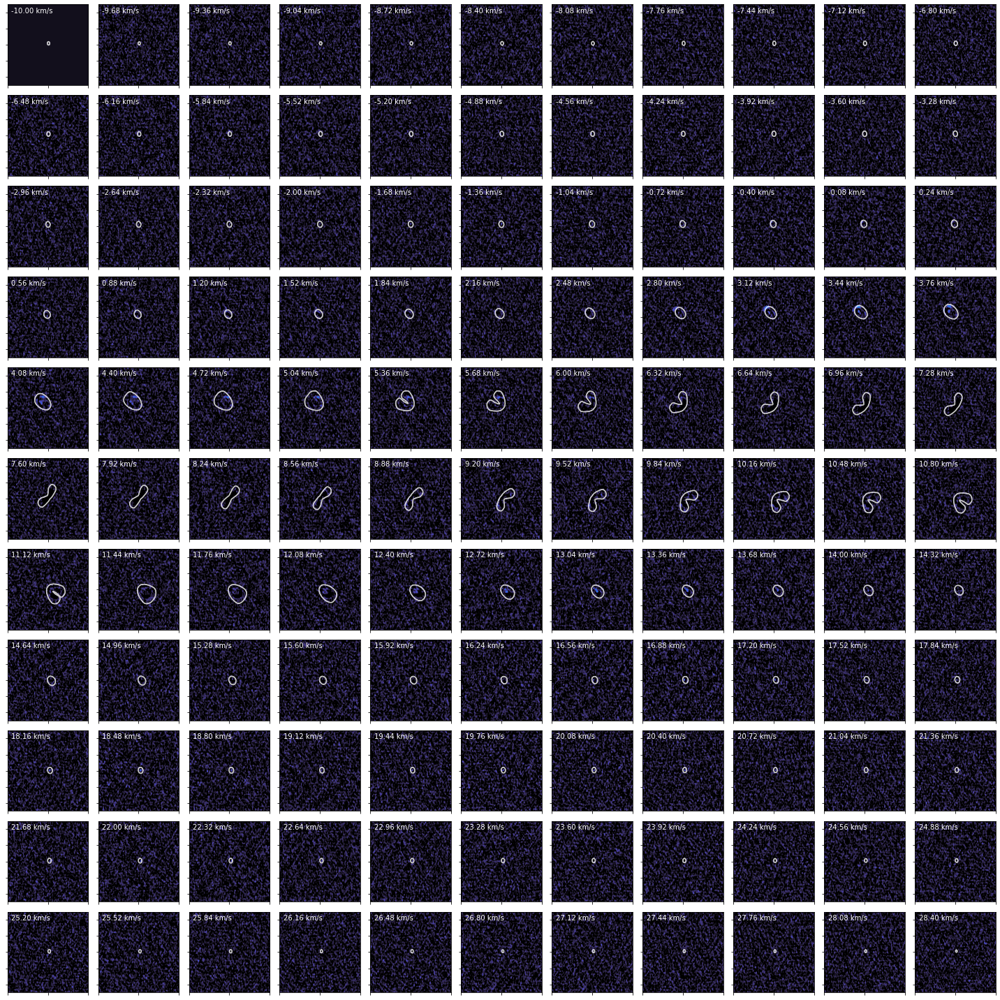

In [197]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/'
mk_ch_plots('im_V892Tau_data.resid.image.fits', 'im_V892Tau_data.mask.fits', 32, grid=True)

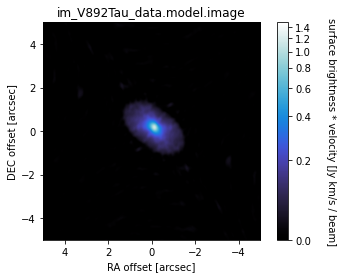

In [199]:
moment0map('im_V892Tau_data.model.image.fits')

In [ ]:
#% matplotlib inline
#% config InlineBackend.figure_format = 'retina' # For mac users with Retina display
from matplotlib import pyplot as plt
import numpy as np
import pygtc
import os, sys
import matplotlib.pyplot as plt
import emcee

# Adapted `plot_pygtc.py`

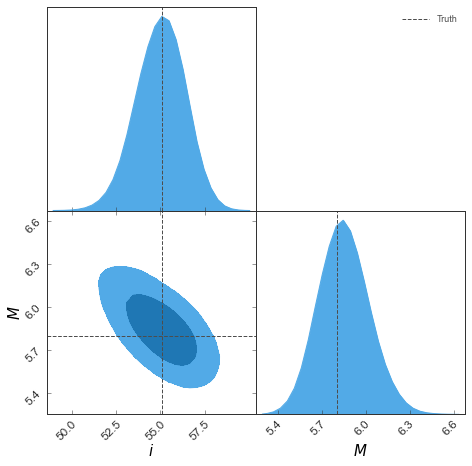

In [223]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/post/posteriors/'

# emcee backend files
fname = 'V892Tau_data_7000it'

# scale burn-in
burnin = 1000

# set parameter labels, truths
lbls = [r'$i$', r'$PA$', r'$M$', r'$r_l$', r'$z0$', r'$z_{\psi}$', r'$Tb_{0}$', r'$Tb_q$', r'$T_{\rm{back}}$', r'$v_{\rm{sys}}$', r'$dx$', r'$dy$']
theta = [55.1, 54.0, 5.8, 215.4, 3.6, 0.5, 777.7, 0.7, 44.4, 7.9, -0.14, 0.20]

# load the backend; parse the samples
reader = emcee.backends.HDFBackend(wdir + fname + '.h5')
all_samples = reader.get_chain(discard=0, flat=False)
samples = reader.get_chain(discard=burnin, flat=False)
log_prob_samples = reader.get_log_prob(discard=burnin, flat=False)
log_prior_samples = reader.get_blobs(discard=burnin, flat=False)
maxlnprob = np.max(reader.get_log_prob(discard=0, flat=False))
minlnprob = np.min(reader.get_log_prob(discard=0, flat=False))
nsteps, nwalk, ndim = samples.shape[0], samples.shape[1], samples.shape[2]

# corner plot to view covariances
levs = 1. - np.exp(-0.5*(np.arange(3)+1)**2)
flat_chain = samples.reshape(-1, ndim)

# Full Corner Plot Diagram
#GTC = pygtc.plotGTC(chains=[flat_chain], truths=theta, paramNames=lbls,
                    #truthLabels='Truth', legendMarker = 'All', customTickFont= {'family':'Arial', 'size':4}, figureSize=7.5)
#GTC.savefig(wdir + 'comparisons/cornerplot_%s_%s_%s.png' % (chainLabels[0], chainLabels[3], chainLabels[2]), dpi=300)

# Individual Corner Plots
iandm = np.stack((flat_chain[:,0], flat_chain[:,2]), axis = -1)
GTC = pygtc.plotGTC(chains=[iandm], truths=[55.1, 5.8], paramNames=[r'$i$', r'$M$'], truthLabels='Truth',
                    legendMarker = 'All', customTickFont = {'family':'Arial', 'size':12},
                    customLabelFont = {'family':'Arial', 'size':15}, figureSize=7.5)
savefolder = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/posterior_plots/'
GTC.savefig(savefolder + 'cornerplot_%s_m_i.png' % fname, dpi=300)

/Users/justinvega/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:100: UserWarning: No contour levels were found within the data range.


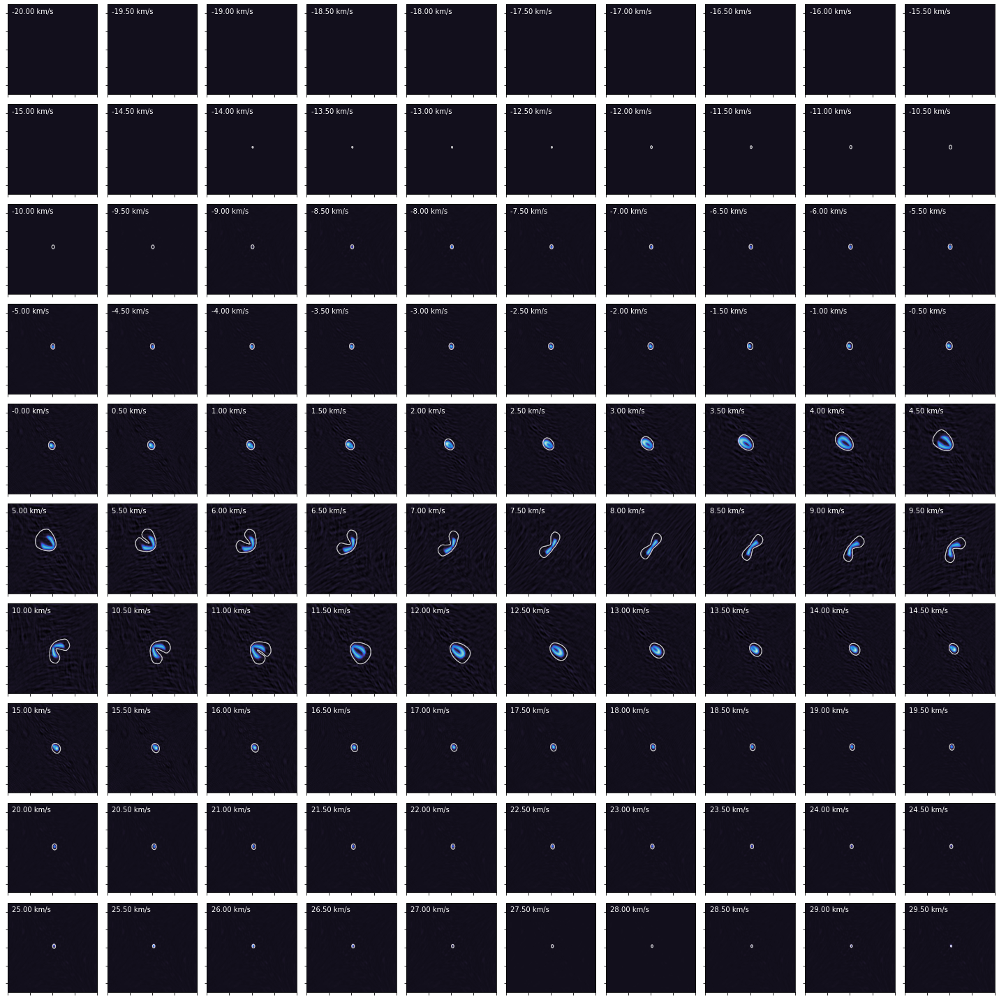

In [252]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/im_V892Tau_model/'
mk_ch_plots('im_V892Tau_data.model.image.fits', 'im_V892Tau_model.mask_0_5_kms_woffset.fits', 47, grid=True)


/Users/justinvega/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:100: UserWarning: No contour levels were found within the data range.


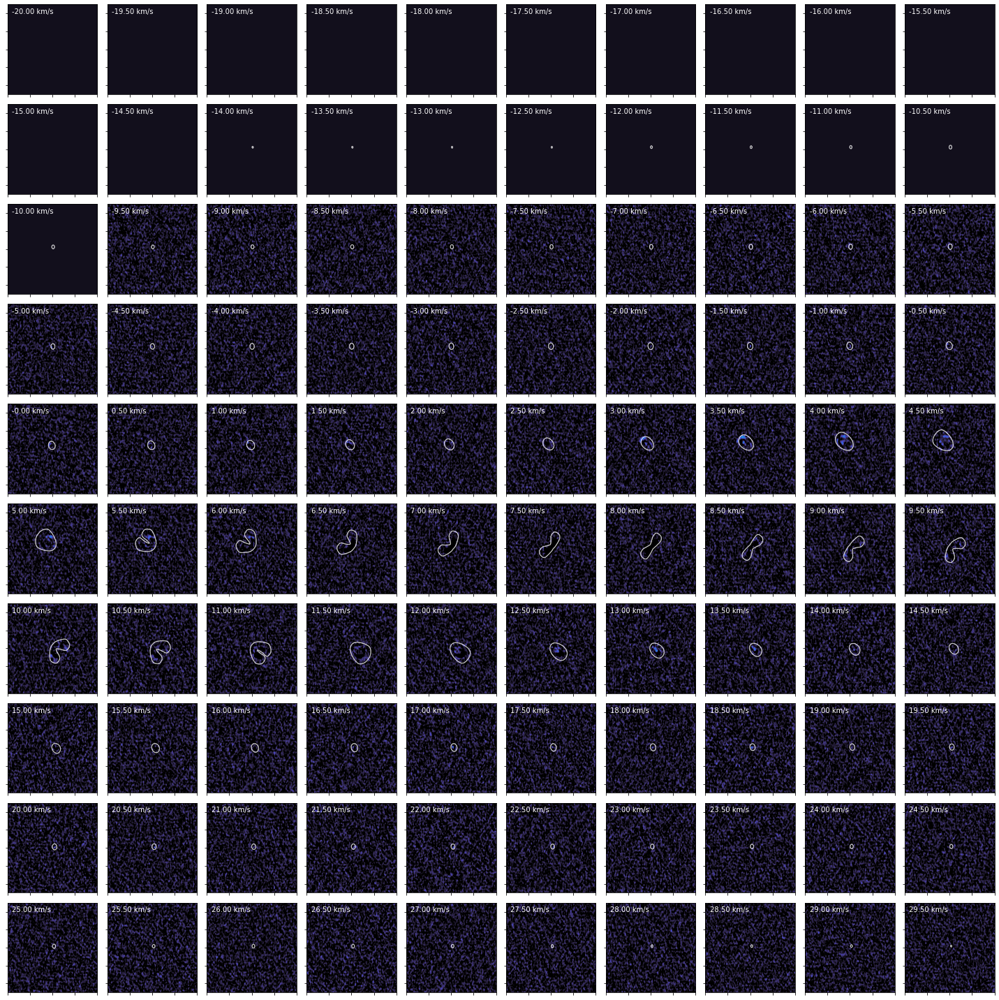

In [253]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/im_V892Tau_model/'
mk_ch_plots('im_V892Tau_data.resid.image.fits', 'im_V892Tau_model.mask_0_5_kms_woffset.fits', 47, grid=True)

In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # For mac users with Retina display
from matplotlib import pyplot as plt
import numpy as np
import pygtc
import os, sys
import matplotlib.pyplot as plt
import emcee
import copy

lbls = [r'$i$', r'$PA$', r'$M$', r'$r_l$', r'$z0$', r'$z_{\psi}$', r'$Tb_{0}$', r'$Tb_q$', r'$T_{\rm{back}}$', r'$dV_{0}$', r'$v_{\rm{sys}}$', r'$dx$', r'$dy$']

# emcee backend files

# scale burn-in
# burnin = 1000

# calculate autocorrelation time as a function of step?
calc_tau = False
Ntau = 100

# load the backend; parse the samples
def make_chain(filename, burnin, stray, trace):
    reader = emcee.backends.HDFBackend(wdir + filename)
    all_samples = reader.get_chain(discard=0, flat=False)
    samples = reader.get_chain(discard=burnin, flat=False)
    log_prob_samples = reader.get_log_prob(discard=burnin, flat=False)
    log_prior_samples = reader.get_blobs(discard=burnin, flat=False)
    maxlnprob = np.max(reader.get_log_prob(discard=0, flat=False))
    minlnprob = np.min(reader.get_log_prob(discard=0, flat=False))
    nsteps, nwalk, ndim = samples.shape[0], samples.shape[1], samples.shape[2]
    
    # finding that stray walker
    if stray == True:
        prob = np.array(reader.get_log_prob(discard=burnin, flat=False))
        prob_mean = np.mean(prob, axis=0) # finds mean prob per walker
        rm_idx = np.where(prob_mean == np.min(prob_mean)) # gives index of lowest mean probability walker
        new_samp = np.delete(samples, rm_idx, axis=1) # removes lowest mean probability walker from samples
        nsteps, nwalk, ndim = new_samp.shape[0], new_samp.shape[1], new_samp.shape[2]
        #print(nsteps, nwalk, ndim)
    
        if trace == True:
            # for trace plot (disable return)
            for i in range(ndim):
                fig = plt.figure(figsize=(5, 5))
                plt.plot(np.arange(nsteps), new_samp[:,:,i], alpha=0.3)
                #plt.plot([0, nsteps], [theta[i], theta[i]], 'r', lw=2)
                plt.ylabel(lbls[i], fontsize=12)
                plt.title('Trace %s' % lbls[i])
                plt.xticks(fontsize=12)
                plt.yticks(fontsize=12)
                plt.show()
        
        else:     
            # corner plot to view covariances
            levs = 1. - np.exp(-0.5*(np.arange(3)+1)**2)
            flat_chain = new_samp.reshape(-1, ndim)
            return(flat_chain)
    
    
    else:
        if trace == True:
        # for trace plot (disable return)
            for i in range(ndim):
                fig = plt.figure(figsize=(5, 5))
                plt.plot(np.arange(nsteps), samples[:,:,i], alpha=0.3)
                #plt.plot([0, nsteps], [theta[i], theta[i]], 'r', lw=2)
                plt.ylabel(lbls[i], fontsize=12)
                plt.title('Trace %s' % lbls[i])
                plt.xticks(fontsize=12)
                plt.yticks(fontsize=12)
                plt.show()
        else:
            flat_chain = samples.reshape(-1, ndim)
            return(flat_chain)

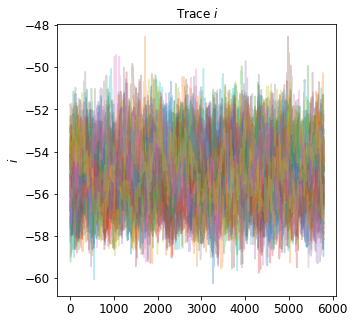

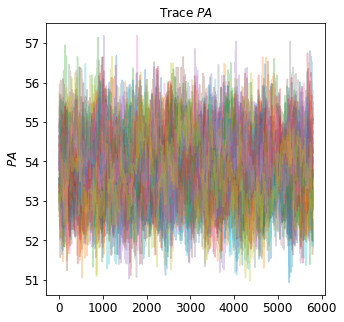

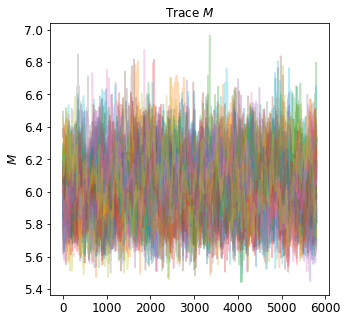

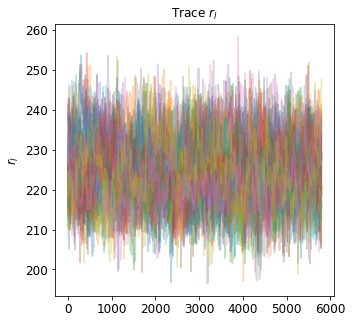

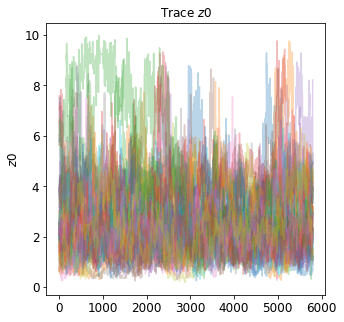

...

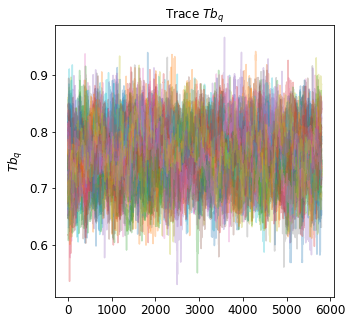

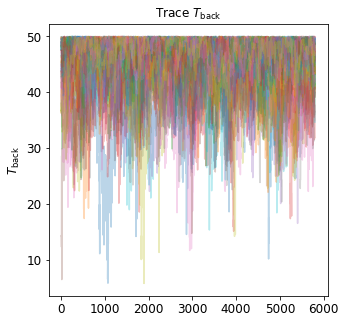

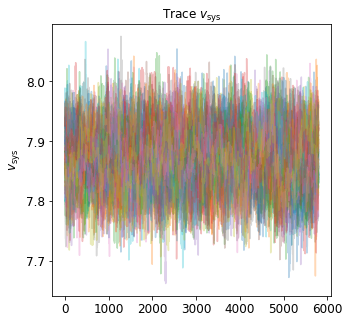

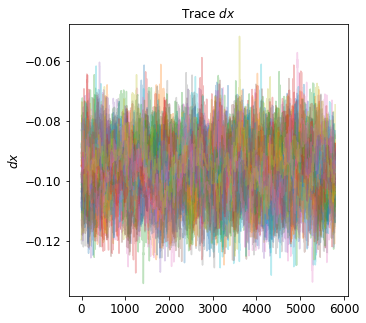

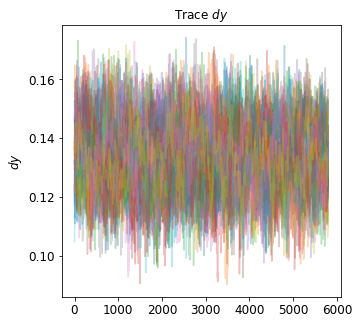

In [15]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/posteriors/'
lbls = [r'$i$', r'$PA$', r'$M$', r'$r_l$', r'$z0$', r'$z_{\psi}$', r'$Tb_{0}$', r'$Tb_q$', r'$T_{\rm{back}}$', r'$v_{\rm{sys}}$', r'$dx$', r'$dy$']
neginc = make_chain('V892Tau_data_neginc.h5', 1200, stray=True)

In [26]:
neginc = make_chain('V892Tau_data_neginc.h5', 1200, stray=True)
posinc = make_chain('V892Tau_data_7000it.h5', 1000, stray=False)
chains = [neginc, posinc]
chainlbls = ['neginc', 'posinc']
names = ['i', 'PA', 'M', 'r_l', 'z0', 'zpsi', 'Tb0', 'Tbq', 'Tback', 'vsys', 'dx', 'dy']

In [27]:
from post_summary import post_summary

for i in range(len(chains)):
    print('V892 %s best-fit parameters' % (chainlbls[i]))
    for j in range(len(names)):
        post_param = post_summary(chains[i][:,j], prec=0.001, mu='peak')
        print('%s = %.2f +%.3f / -%.3f' % (names[j], post_param[0], post_param[1], post_param[2]))
    print()

V892 neginc best-fit parameters
i = -55.35 +1.626 / -1.041
PA = 53.75 +0.845 / -0.643
M = 6.02 +0.187 / -0.160
r_l = 224.29 +7.237 / -6.058
z0 = 2.23 +1.440 / -0.702
zpsi = 0.67 +0.148 / -0.182
Tb0 = 849.19 +93.587 / -78.620
Tbq = 0.77 +0.036 / -0.056
Tback = 49.09 +0.000 / -7.816
vsys = 7.88 +0.040 / -0.050
dx = -0.10 +0.008 / -0.009
dy = 0.13 +0.012 / -0.008

V892 posinc best-fit parameters
i = 55.30 +1.045 / -1.626
PA = 54.11 +0.547 / -0.908
M = 5.83 +0.181 / -0.149
r_l = 215.43 +6.508 / -6.485
z0 = 2.48 +2.973 / -0.457
zpsi = 0.37 +0.293 / -0.091
Tb0 = 784.91 +79.207 / -91.512
Tbq = 0.73 +0.040 / -0.060
Tback = 48.56 +0.000 / -11.712
vsys = 7.88 +0.042 / -0.045
dx = -0.14 +0.010 / -0.010
dy = 0.20 +0.012 / -0.009



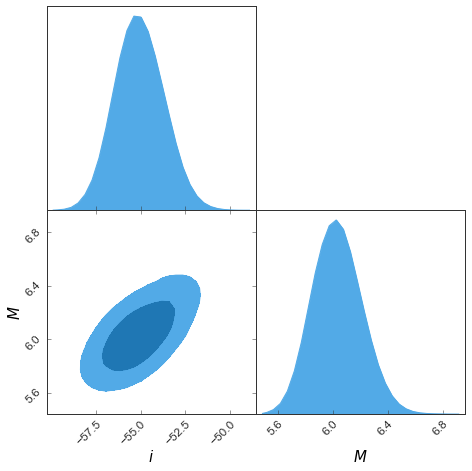

In [31]:
# Full Corner Plot Diagram
#GTC = pygtc.plotGTC(chains=[neginc], truths=theta, paramNames=lbls,
                    #truthLabels='Truth', legendMarker = 'All', customTickFont= {'family':'Arial', 'size':4}, figureSize=7.5)
#GTC.savefig(wdir + 'comparisons/cornerplot_%s_%s_%s.png' % (chainLabels[0], chainLabels[3], chainLabels[2]), dpi=300)

# Individual Corner Plots
iandm = np.stack((neginc[:,0], neginc[:,2]), axis = -1)
GTC = pygtc.plotGTC(chains=[iandm], paramNames=[r'$i$', r'$M$'],
                    legendMarker = 'All', customTickFont = {'family':'Arial', 'size':12},
                    customLabelFont = {'family':'Arial', 'size':15}, figureSize=7.5)
#savefolder = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/V892Tau/posterior_plots/'
#GTC.savefig(savefolder + 'cornerplot_%s_m_i.png' % fname, dpi=300)

In [12]:
wdir = '/Users/justinvega/Documents/GitHub/dyn-masses/fit_Mdyn/posteriors/'
#lbls = [r'$i$', r'$PA$', r'$M$', r'$r_l$', r'$z0$', r'$z_{\psi}$', r'$Tb_{0}$', r'$Tb_q$', r'$T_{\rm{back}}$', r'$v_{\rm{sys}}$', r'$dx$', r'$dy$']
posinc = make_chain('V892Tau_data_posinc.h5', 1000, stray=False, trace=False)

In [20]:
from post_summary import post_summary
print('V892 %s best-fit parameters' % ('posinc'))
names = ['i', 'PA', 'M', 'r_l', 'z0', 'zpsi', 'Tb0', 'Tbq', 'Tback', 'vsys', 'dx', 'dy']
for j in range(len(names)):
    post_param = post_summary(posinc[:,j], prec=0.001, mu='peak')
    print('%s = %.2f +%.3f / -%.3f' % (names[j], post_param[0], post_param[1], post_param[2]))

V892 posinc best-fit parameters
i = 55.05 +1.308 / -1.264
PA = 54.01 +0.642 / -0.816
M = 6.01 +0.201 / -0.132
r_l = 224.42 +5.317 / -8.051
z0 = 2.39 +3.195 / -0.306
zpsi = 0.39 +0.269 / -0.103
Tb0 = 779.83 +108.953 / -67.025
Tbq = 0.73 +0.049 / -0.052
Tback = 48.53 +0.000 / -11.857
vsys = 7.88 +0.043 / -0.044
dx = -0.14 +0.008 / -0.011
dy = 0.20 +0.014 / -0.008
